In [17]:
%tensorflow_version 1.x # 確保 colob 中使用的 tensorflow 是 1.x 版本而不是 tensorflow 2
import tensorflow as tf
print(tf.__version__)

`%tensorflow_version` only switches the major version: `1.x` or `2.x`.
You set: `1.x # 確保 colob 中使用的 tensorflow 是 1.x 版本而不是 tensorflow 2`. This will be interpreted as: `1.x`.


TensorFlow is already loaded. Please restart the runtime to change versions.
1.15.0


In [18]:
pip install keras==2.2.4 # 需要安裝 keras 2.2.4 的版本

In [1]:
from google.colab import drive 
drive.mount('/content/gdrive') # 將 google drive 掛載在 colob，
# 下載基於 keras 的 yolov3 程式碼
%cd 'gdrive/My Drive/final_prj'

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
/content/gdrive/My Drive/final_prj


In [0]:
import xml.etree.ElementTree as ET # 載入能夠 Parser xml 文件的 library
import os
from os import getcwd

sets=[('train'), ('val')]
classes = ["kangaroo", "raccoon"] #資料類別
wd = "."

# 把 annotation 轉換訓練時需要的資料形態
def convert_annotation(clss, image_id):
    in_file = open('{}/annots/{}.xml'.format(clss, image_id))
    tree=ET.parse(in_file)
    root = tree.getroot()
    str_name_size = ""

    for obj in root.iter('object'):
        difficult = obj.find('difficult').text
        cls = obj.find('name').text
        if cls not in classes or int(difficult)==1:
            continue
        cls_id = classes.index(cls)
        xmlbox = obj.find('bndbox')
        b = (int(xmlbox.find('xmin').text), int(xmlbox.find('ymin').text), int(xmlbox.find('xmax').text), int(xmlbox.find('ymax').text))
        #list_file.write(" " + ",".join([str(a) for a in b]) + ',' + str(cls_id))
        str_name_size += " " + ",".join([str(a) for a in b]) + ',' + str(cls_id)
        
    return str_name_size

In [6]:
path = '{}/images/'.format(classes[0])
kangaroo_image_ids = []
for (dir,dirs,files) in os.walk(path):
    for file in files:
        #print(dir.strip()+file.strip())
        #raccoon_image_ids.append(dir.strip()+file.strip()) 
        kangaroo_path = wd + '/' + dir.strip()+file.strip()
        file = file.strip().split('.')
        kangaroo_image_ids.append(kangaroo_path+convert_annotation(classes[0], file[0]))

kangaroo_image_ids[0:4]

['./kangaroo/images/00002.jpg 156,114,240,309,0 222,117,415,306,0',
 './kangaroo/images/00001.jpg 233,89,386,262,0 134,105,341,253,0',
 './kangaroo/images/00003.jpg 99,5,403,279,0',
 './kangaroo/images/00004.jpg 15,71,316,233,0']

In [7]:
path = '{}/images/'.format(classes[1])
raccoon_image_ids = []
for (dir,dirs,files) in os.walk(path):
    for file in files:
        #print(dir.strip()+file.strip())
        #raccoon_image_ids.append(dir.strip()+file.strip()) 
        raccoon_path = wd + '/' + dir.strip()+file.strip()
        file = file.strip().split('.')
        raccoon_image_ids.append(raccoon_path+convert_annotation(classes[1], file[0]))

raccoon_image_ids[0:4]

['./raccoon/images/raccoon-1.jpg 81,88,522,408,1',
 './raccoon/images/raccoon-100.jpg 548,10,954,520,1',
 './raccoon/images/raccoon-10.jpg 130,2,446,488,1',
 './raccoon/images/raccoon-106.jpg 31,21,226,146,1']

In [0]:
images_annots = kangaroo_image_ids + raccoon_image_ids

annotation_path = 'all_img_annots.txt'
list_file = open(annotation_path, 'w')
for img in images_annots:
    list_file.write(img)
    list_file.write('\n')

In [0]:
import random

def random_shuffle(list_annots, percent):
    num = int(round(percent*len(list_annots)))  
    shuffled = list_annots[:]
    random.shuffle(shuffled)
    return shuffled[:num], shuffled[num:]

In [0]:
train_kangaroo, val_kangaroo = random_shuffle(kangaroo_image_ids, 0.85)

In [0]:
train_raccoon, val_raccoon = random_shuffle(raccoon_image_ids, 0.85)

In [0]:
train_path = 'train_img_annots.txt'
list_file = open(train_path, 'w')
img_train = train_kangaroo + train_raccoon
for img in img_train:
    list_file.write(img)
    list_file.write('\n')
list_file.close()

val_path = 'val_img_annots.txt'
list_file = open(val_path, 'w')
img_val = val_kangaroo + val_raccoon
for img in img_val:
    list_file.write(img)
    list_file.write('\n')
list_file.close()

In [3]:
import numpy as np
import tensorflow as tf
import keras.backend as K
from keras.layers import Input, Lambda
from keras.models import Model
from keras.optimizers import Adam
from keras.callbacks import TensorBoard, ModelCheckpoint, ReduceLROnPlateau, EarlyStopping

from yolo3.model import preprocess_true_boxes, yolo_body, tiny_yolo_body, yolo_loss
from yolo3.utils import get_random_data

# 將 train.py 所需要的套件載入
from train import get_classes, get_anchors, create_model, create_tiny_model, data_generator, data_generator_wrapper

from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

Using TensorFlow backend.


In [0]:
if not os.path.exists("model_data/yolo_weights.h5"):
    print("Converting pretrained YOLOv3 weights for training")
    os.system("python convert.py -w yolov3.cfg yolov3.weights model_data/yolo_weights.h5") 
else:
    print("Pretrained weights exists")

Pretrained weights exists


In [9]:
annotation_path = 'train_img_annots.txt' # 轉換好格式的標註檔案
log_dir = 'logs/000/' # 訓練好的模型儲存的路徑
classes_path = 'model_data/voc_classes.txt'
anchors_path = 'model_data/yolo_anchors.txt'
class_names = get_classes(classes_path)
num_classes = len(class_names)
anchors = get_anchors(anchors_path)

input_shape = (416,416) # multiple of 32, hw

is_tiny_version = len(anchors)==6 # default setting
if is_tiny_version:
    model = create_tiny_model(input_shape, anchors, num_classes,
        freeze_body=2, weights_path='model_data/tiny_yolo_weights.h5')
else:
    model = create_model(input_shape, anchors, num_classes,
        freeze_body=2, weights_path='model_data/yolo_weights.h5') # make sure you know what you freeze

logging = TensorBoard(log_dir=log_dir)
checkpoint = ModelCheckpoint(log_dir + 'ep{epoch:03d}-loss{loss:.3f}-val_loss{val_loss:.3f}.h5',
    monitor='val_loss', save_weights_only=True, save_best_only=True, period=3)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=1)

# 分為 training 以及 validation
val_split = 0.1
with open(annotation_path) as f:
    lines = f.readlines()
np.random.seed(10101)
np.random.shuffle(lines)
np.random.seed(None)
num_val = int(len(lines)*val_split)
num_train = len(lines) - num_val

# Train with frozen layers first, to get a stable loss.
# Adjust num epochs to your dataset. This step is enough to obtain a not bad model.
# 一開始先 freeze YOLO 除了 output layer 以外的 darknet53 backbone 來 train
if True:
    model.compile(optimizer=Adam(lr=1e-3), loss={
        # use custom yolo_loss Lambda layer.
        'yolo_loss': lambda y_true, y_pred: y_pred})

    batch_size = 16
    print('Train on {} samples, val on {} samples, with batch size {}.'.format(num_train, num_val, batch_size))
    # 模型利用 generator 產生的資料做訓練，強烈建議大家去閱讀及理解 data_generator_wrapper 在 train.py 中的實現
    model.fit_generator(data_generator_wrapper(lines[:num_train], batch_size, input_shape, anchors, num_classes),
            steps_per_epoch=max(1, num_train//batch_size),
            validation_data=data_generator_wrapper(lines[num_train:], batch_size, input_shape, anchors, num_classes),
            validation_steps=max(1, num_val//batch_size),
            epochs=50,
            initial_epoch=0,
            callbacks=[logging, checkpoint])
    model.save_weights(log_dir + 'trained_weights_stage_1.h5')

# Unfreeze and continue training, to fine-tune.
# Train longer if the result is not good.
if True:
    # 把所有 layer 都改為 trainable
    for i in range(len(model.layers)):
        model.layers[i].trainable = True
    model.compile(optimizer=Adam(lr=1e-4), loss={'yolo_loss': lambda y_true, y_pred: y_pred}) # recompile to apply the change
    print('Unfreeze all of the layers.')

    batch_size = 16 # note that more GPU memory is required after unfreezing the body
    print('Train on {} samples, val on {} samples, with batch size {}.'.format(num_train, num_val, batch_size))
    model.fit_generator(data_generator_wrapper(lines[:num_train], batch_size, input_shape, anchors, num_classes),
        steps_per_epoch=max(1, num_train//batch_size),
        validation_data=data_generator_wrapper(lines[num_train:], batch_size, input_shape, anchors, num_classes),
        validation_steps=max(1, num_val//batch_size),
        epochs=100,
        initial_epoch=50,
        callbacks=[logging, checkpoint, reduce_lr, early_stopping])
    model.save_weights(log_dir + 'trained_weights_final.h5')














Create YOLOv3 model with 9 anchors and 2 classes.


/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:1140: UserWarning: Skipping loading of weights for layer conv2d_59 due to mismatch in shape ((1, 1, 1024, 21) vs (255, 1024, 1, 1)).
  weight_values[i].shape))
/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:1140: UserWarning: Skipping loading of weights for layer conv2d_59 due to mismatch in shape ((21,) vs (255,)).
  weight_values[i].shape))
/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:1140: UserWarning: Skipping loading of weights for layer conv2d_67 due to mismatch in shape ((1, 1, 512, 21) vs (255, 512, 1, 1)).
  weight_values[i].shape))
/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:1140: UserWarning: Skipping loading of weights for layer conv2d_67 due to mismatch in shape ((21,) vs (255,)).
  weight_values[i].shape))
/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:1140: UserWarning: Skipping loading of weights for layer conv2d_75 due to mismatch in shape ((1,

Load weights model_data/yolo_weights.h5.
Freeze the first 249 layers of total 252 layers.

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where

Train on 279 samples, val on 30 samples, with batch size 16.




Epoch 1/50
17/17 [==============================] - 141s 8s/step - loss: 3193.7090 - val_loss: 952.7360

Epoch 2/50
17/17 [==============================] - 21s 1s/step - loss: 580.3824 - val_loss: 286.1078
Epoch 3/50
17/17 [==============================] - 21s 1s/step - loss: 244.9703 - val_loss: 169.2039
Epoch 4/50
17/17 [==============================] - 8s 487ms/step - loss: 162.6202 - val_loss: 120.2806
Epoch 5/50
17/17 [==============================] - 21s 1s/step - loss: 128.5125 - val_loss: 99.2305
Epoch 6/50
17/17 [==============================] - 20s 1s/step - loss: 107.9131 - val_loss: 89.3100
Epoch 7/50
17/17 [==============================] - 20s 1s/step - loss: 89.6020 - val_loss: 76.4004
Epoch 8/50
17/17 [================

In [0]:
from PIL import Image
image = Image.open('raccoon/images/raccoon-41.jpg') 

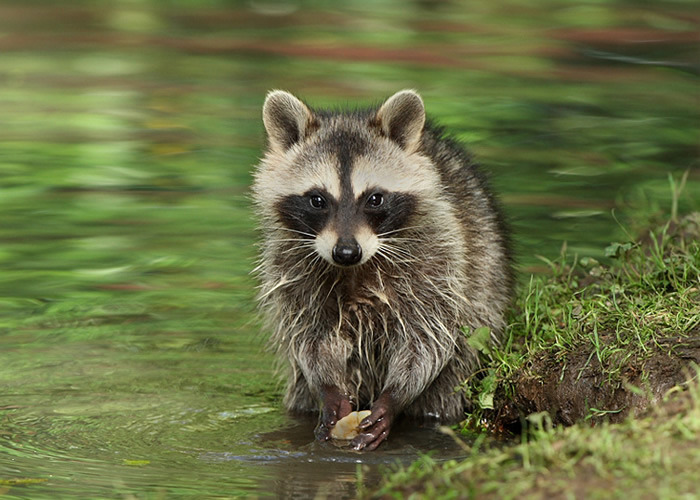

In [5]:
image

In [6]:
log_dir = 'logs/000/' # 訓練好的模型儲存的路徑
classes_path = 'model_data/voc_classes.txt'

from yolo import YOLO
yolo_model = YOLO(model_path=log_dir + 'trained_weights_final.h5', classes_path=classes_path)
#r_image = yolo_model.detect_image(image)













logs/000/trained_weights_final.h5 model, anchors, and classes loaded.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


(416, 416, 3)
Found 1 boxes for img
raccoon 0.91 (197, 26) (457, 428)
0.048426143000142474


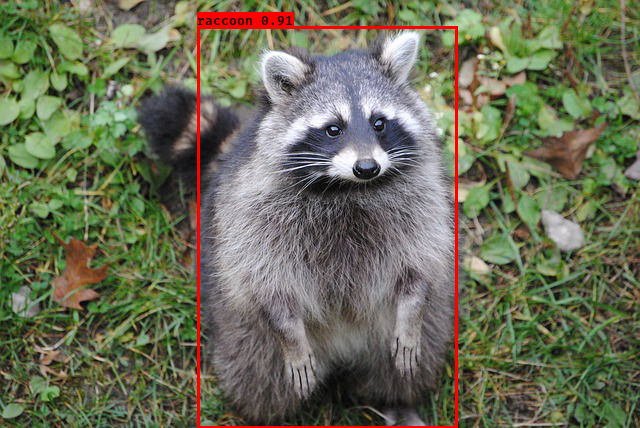

In [25]:
yolo_model.detect_image(Image.open('raccoon/images/raccoon-36.jpg') )

(416, 416, 3)
Found 2 boxes for img
raccoon 0.35 (304, 186) (410, 298)
raccoon 0.54 (41, 193) (151, 289)
0.04715584400037187


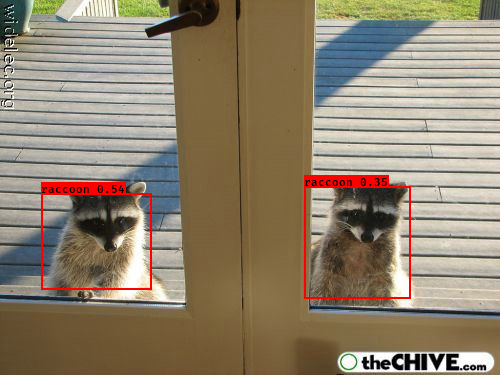

In [24]:
yolo_model.detect_image(Image.open('raccoon/images/raccoon-148.jpg') )

(416, 416, 3)
Found 1 boxes for img
kangaroo 0.48 (19, 50) (639, 248)
0.04548834899924259


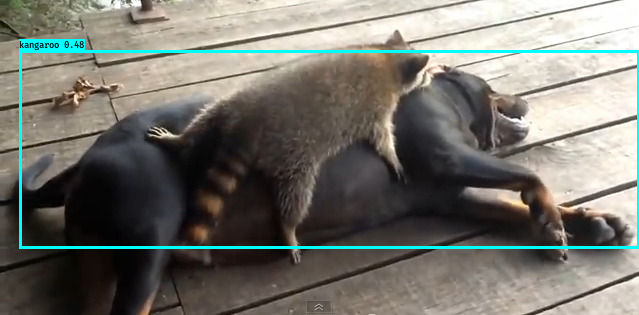

In [26]:
yolo_model.detect_image(Image.open('raccoon/images/raccoon-129.jpg') )

(416, 416, 3)
Found 2 boxes for img
raccoon 0.59 (23, 123) (291, 325)
raccoon 0.81 (314, 107) (640, 283)
0.053028835999612056


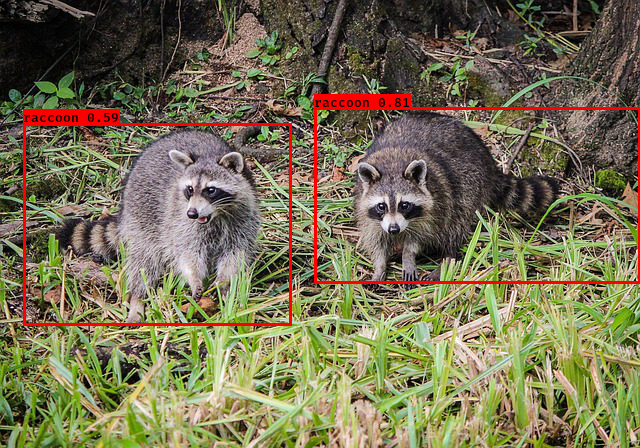

In [28]:
yolo_model.detect_image(Image.open('raccoon/images/raccoon-117.jpg') )

(416, 416, 3)
Found 1 boxes for img
raccoon 0.85 (71, 87) (291, 245)
0.04745542900036526


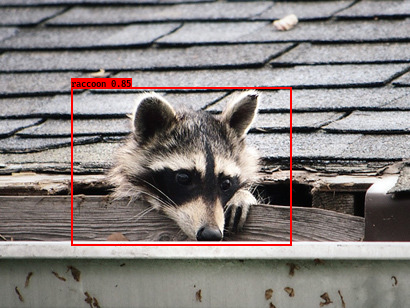

In [31]:
yolo_model.detect_image(Image.open('raccoon/images/raccoon-7.jpg') )

(416, 416, 3)
Found 1 boxes for img
raccoon 0.97 (47, 99) (372, 346)
0.047728624998853775


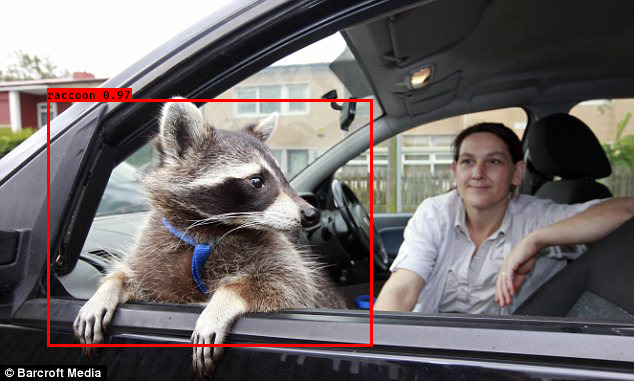

In [39]:
yolo_model.detect_image(Image.open('raccoon/images/raccoon-175.jpg') )

(416, 416, 3)
Found 1 boxes for img
raccoon 0.85 (68, 61) (856, 1018)
0.07610511700022471


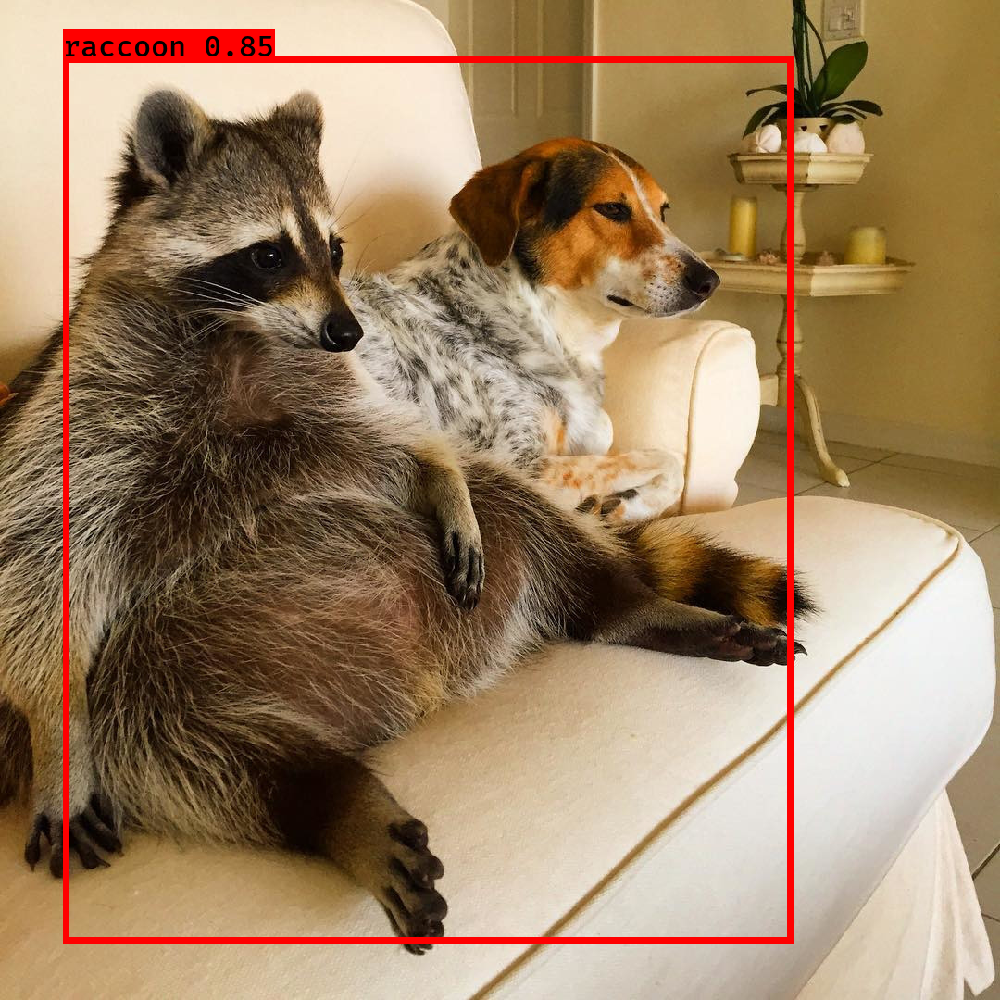

In [11]:
yolo_model.detect_image(Image.open('raccoon/images/raccoon-194.jpg') )

(416, 416, 3)
Found 1 boxes for img
kangaroo 0.93 (175, 4) (315, 339)
0.04782599999998638


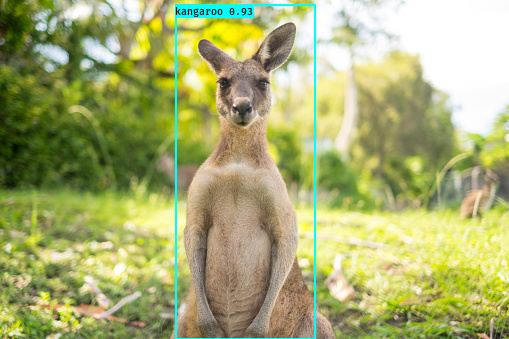

In [16]:
yolo_model.detect_image(Image.open('kangaroo/images/00055.jpg') )

(416, 416, 3)
Found 1 boxes for img
kangaroo 0.70 (141, 49) (220, 396)
0.045296743999642786


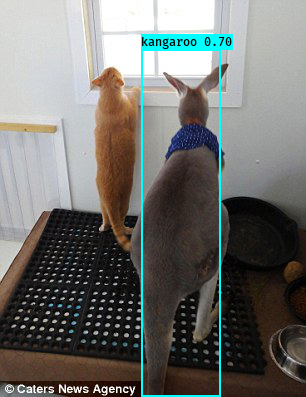

In [20]:
yolo_model.detect_image(Image.open('kangaroo/images/00072.jpg') )

(416, 416, 3)
Found 1 boxes for img
kangaroo 0.32 (289, 129) (420, 348)
0.053684070000599604


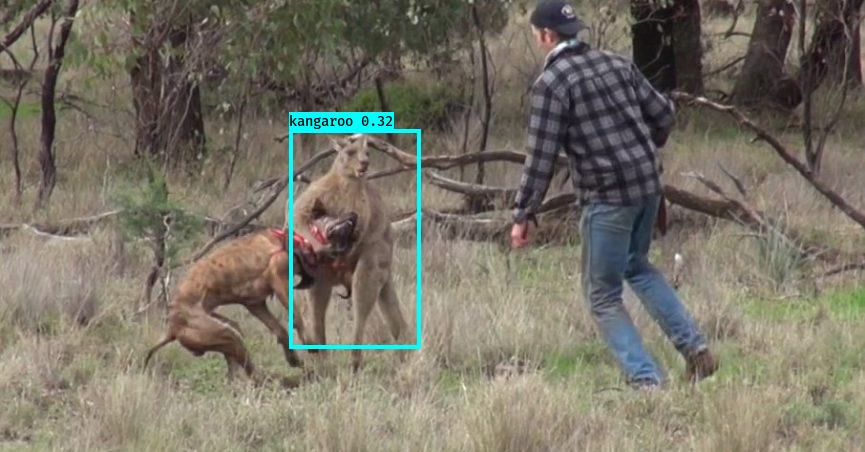

In [22]:
yolo_model.detect_image(Image.open('kangaroo/images/00131.jpg') )

(416, 416, 3)
Found 1 boxes for img
kangaroo 0.95 (108, 15) (392, 549)
0.05575208000027487


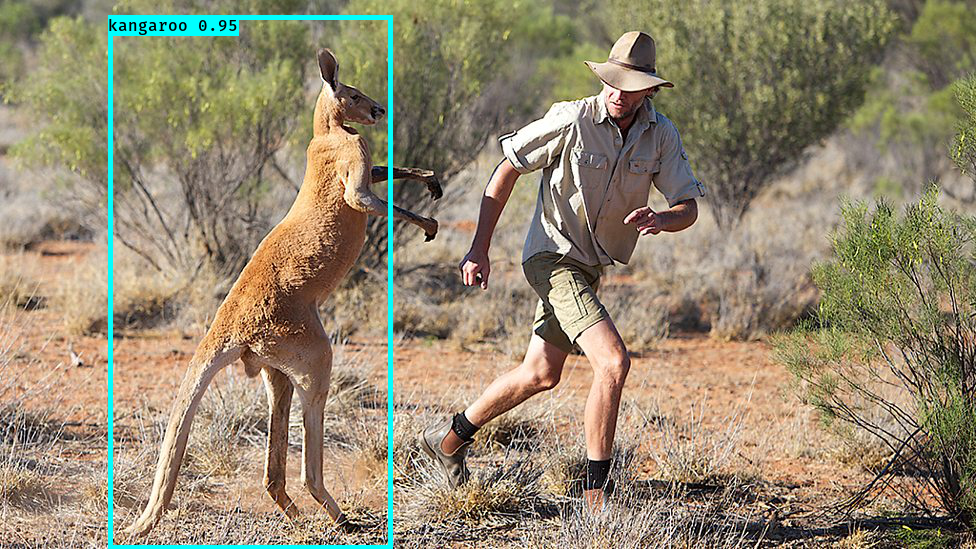

In [23]:
yolo_model.detect_image(Image.open('kangaroo/images/00105.jpg') )

(416, 416, 3)
Found 0 boxes for img
0.05414309899970249


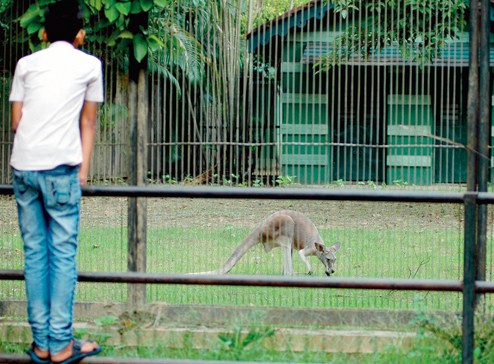

In [19]:
yolo_model.detect_image(Image.open('kangaroo/images/00047.jpg') )

(416, 416, 3)
Found 2 boxes for img
raccoon 0.98 (294, 57) (564, 327)
kangaroo 0.39 (61, 31) (248, 324)
0.05182372000126634


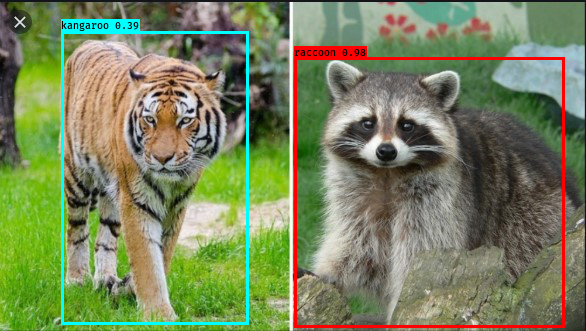

In [40]:
yolo_model.detect_image(Image.open('test_img/test01.jpg') )

(416, 416, 3)
Found 1 boxes for img
raccoon 0.73 (159, 109) (399, 241)
0.04588404099922627


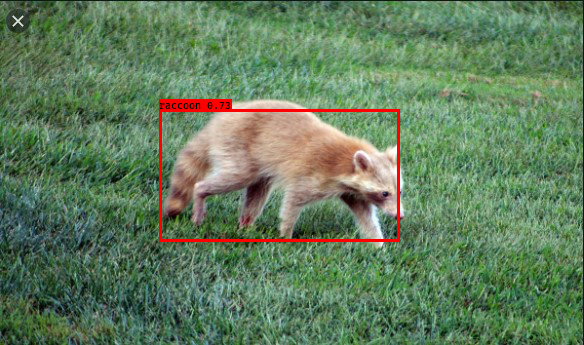

In [41]:
yolo_model.detect_image(Image.open('test_img/test02.jpg') )

(416, 416, 3)
Found 1 boxes for img
kangaroo 0.89 (0, 0) (492, 349)
0.051602678999188356


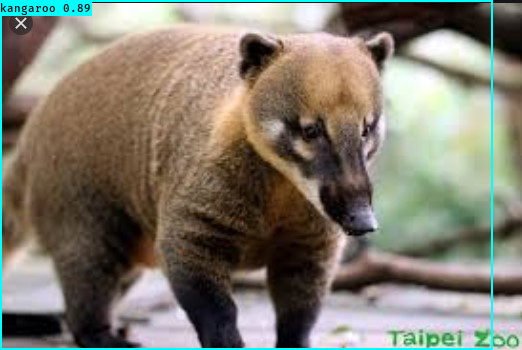

In [42]:
yolo_model.detect_image(Image.open('test_img/test03.jpg') )

(416, 416, 3)
Found 4 boxes for img
raccoon 0.47 (12, 166) (224, 450)
raccoon 0.49 (187, 103) (456, 340)
kangaroo 0.31 (12, 166) (224, 450)
kangaroo 0.40 (187, 103) (456, 340)
0.05516563600031077


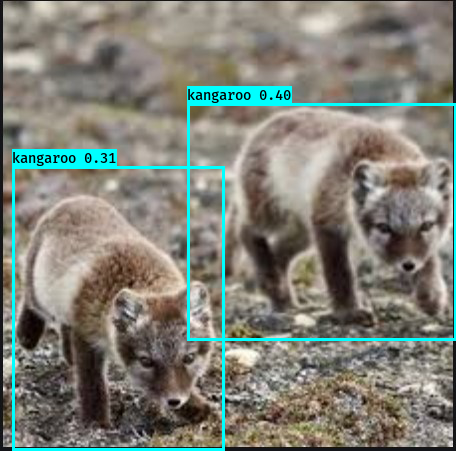

In [43]:
yolo_model.detect_image(Image.open('test_img/test04.jpg') )

(416, 416, 3)
Found 2 boxes for img
kangaroo 0.32 (0, 137) (209, 373)
kangaroo 0.60 (29, 68) (510, 288)
0.051347847998840734


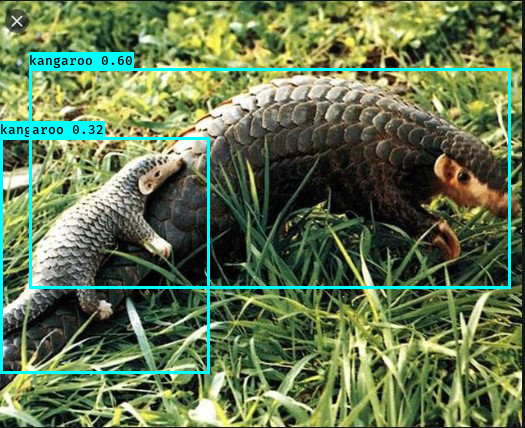

In [44]:
yolo_model.detect_image(Image.open('test_img/test05.jpg') )

(416, 416, 3)
Found 1 boxes for img
kangaroo 0.89 (1, 22) (436, 306)
0.043637467999360524


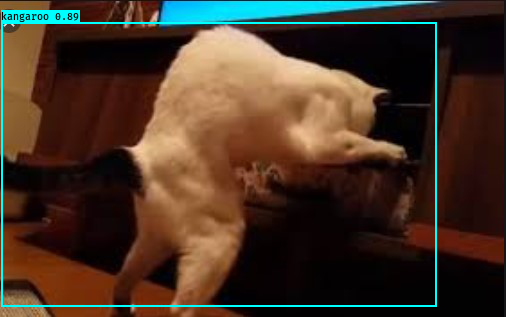

In [45]:
yolo_model.detect_image(Image.open('test_img/test06.jpg') )

(416, 416, 3)
Found 1 boxes for img
kangaroo 0.37 (25, 74) (411, 316)
0.04463118499916163


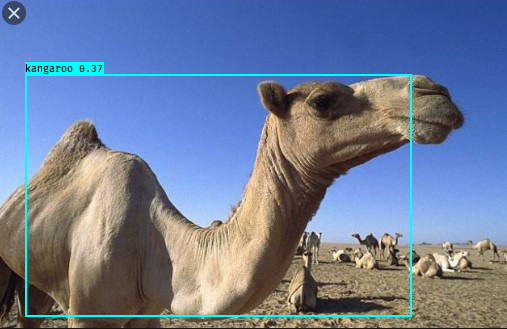

In [46]:
yolo_model.detect_image(Image.open('test_img/test07.jpg') )

(416, 416, 3)
Found 1 boxes for img
kangaroo 0.59 (0, 0) (257, 522)
0.04900672799885797


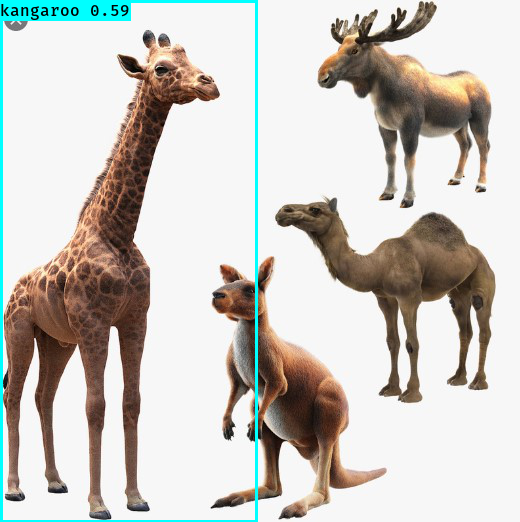

In [47]:
yolo_model.detect_image(Image.open('test_img/test08.jpg') )

(416, 416, 3)
Found 1 boxes for img
kangaroo 0.82 (165, 0) (515, 348)
0.04721228900052665


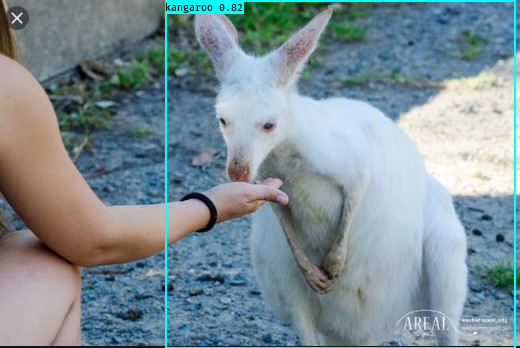

In [48]:
yolo_model.detect_image(Image.open('test_img/test09.jpg') )

(416, 416, 3)
Found 0 boxes for img
0.04291545399973984


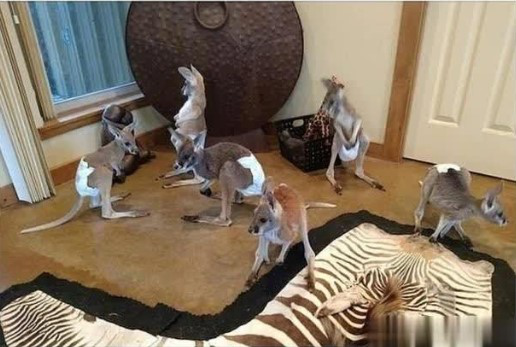

In [49]:
yolo_model.detect_image(Image.open('test_img/test10.jpg') )